# 🚖📊 Comprehensive Taxi & Air Pollution Analysis Notebook
This notebook guides you through an end-to-end analysis of taxi mobility and air quality data in Chicago, including:
1. Detailed data exploration (EDA)
2. Spatio-temporal joining via GeoHash and hourly bins
3. Pattern and correlation analysis
4. Clustering with DBSCAN and silhouette evaluation
5. Parameter sweeps to tune DBSCAN
6. A weighted-DBSCAN variant
7. Visual summaries and key findings

In [23]:
import numpy as np
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns
import geohash2 as geohash
from datetime import timedelta
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
plt.rcParams['figure.figsize'] = (10,4)
%matplotlib inline

## 1. Setup & Data Loading

In [24]:

# Path to your data folder
data_folder = "./Data/"

# Merge Air Quality CSV files into aq_df
aq_files = sorted(glob.glob(os.path.join(data_folder, "chicago_eclipse_data_part_*.csv")))
aq_df = pd.concat((pd.read_csv(file) for file in aq_files), ignore_index=True)

# Load Taxi data into taxi_df
taxi_df = pd.read_csv(os.path.join(data_folder, "taxi_data.csv"))

# Verify the dataframes
print("Air Quality DataFrame shape:", aq_df.shape)
print(aq_df.head())

print("\nTaxi DataFrame shape:", taxi_df.shape)
print(taxi_df.head())


Air Quality DataFrame shape: (2461089, 16)
      City  DeviceId           LocationName   Latitude  Longitude  \
0  Chicago      2002  State & Garfield (SB)  41.794921 -87.625857   
1  Chicago      2002  State & Garfield (SB)  41.794921 -87.625857   
2  Chicago      2002  State & Garfield (SB)  41.794921 -87.625857   
3  Chicago      2002  State & Garfield (SB)  41.794921 -87.625857   
4  Chicago      2002  State & Garfield (SB)  41.794921 -87.625857   

    ReadingDateTimeUTC      PM25  CalibratedPM25  CalibratedO3  CalibratedNO2  \
0  2021-06-20 00:03:00  5.561094             NaN           NaN            NaN   
1  2021-06-20 00:08:10  6.633914             NaN           NaN            NaN   
2  2021-06-20 00:13:20  4.068707             NaN           NaN            NaN   
3  2021-06-20 00:18:30  6.351702             NaN           NaN            NaN   
4  2021-06-20 00:23:40  9.574065             NaN           NaN            NaN   

         CO  Temperature   Humidity  BatteryLevel  Perc

In [25]:
# Print all column names for aq_df
print("Air Quality Data (aq_df) columns:")
print(aq_df.columns.tolist())

# Print all column names for taxi_df
print("\nTaxi Data (taxi_df) columns:")
print(taxi_df.columns.tolist())


Air Quality Data (aq_df) columns:
['City', 'DeviceId', 'LocationName', 'Latitude', 'Longitude', 'ReadingDateTimeUTC', 'PM25', 'CalibratedPM25', 'CalibratedO3', 'CalibratedNO2', 'CO', 'Temperature', 'Humidity', 'BatteryLevel', 'PercentBattery', 'CellSignal']

Taxi Data (taxi_df) columns:
['Taxi ID', 'Trip Start Timestamp', 'Trip End Timestamp', 'Trip Seconds', 'Trip Miles', 'Company', 'Pickup Centroid Latitude', 'Pickup Centroid Longitude', 'Pickup Centroid Location', 'Dropoff Centroid Latitude', 'Dropoff Centroid Longitude', 'Dropoff Centroid  Location', 'Trip ID']


In [26]:
# Selecting relevant columns from Air Quality Data
aq_df = aq_df[['DeviceId', 'LocationName', 'Latitude', 'Longitude', 'ReadingDateTimeUTC', 
               'PM25', 'CalibratedPM25', 'CalibratedO3', 'CalibratedNO2', 'CO', 
               'Temperature', 'Humidity']]

# Selecting relevant columns from Taxi Data
taxi_df = taxi_df[['Taxi ID', 'Trip Start Timestamp', 'Trip End Timestamp', 
                   'Trip Seconds', 'Trip Miles', 'Pickup Centroid Latitude', 
                   'Pickup Centroid Longitude', 'Dropoff Centroid Latitude', 
                   'Dropoff Centroid Longitude', 'Company']]

# Check new shapes and columns
print("Filtered Air Quality Data shape:", aq_df.shape)
print(aq_df.head())

print("\nFiltered Taxi Data shape:", taxi_df.shape)
print(taxi_df.head())


Filtered Air Quality Data shape: (2461089, 12)
   DeviceId           LocationName   Latitude  Longitude   ReadingDateTimeUTC  \
0      2002  State & Garfield (SB)  41.794921 -87.625857  2021-06-20 00:03:00   
1      2002  State & Garfield (SB)  41.794921 -87.625857  2021-06-20 00:08:10   
2      2002  State & Garfield (SB)  41.794921 -87.625857  2021-06-20 00:13:20   
3      2002  State & Garfield (SB)  41.794921 -87.625857  2021-06-20 00:18:30   
4      2002  State & Garfield (SB)  41.794921 -87.625857  2021-06-20 00:23:40   

       PM25  CalibratedPM25  CalibratedO3  CalibratedNO2        CO  \
0  5.561094             NaN           NaN            NaN  0.123580   
1  6.633914             NaN           NaN            NaN  0.132103   
2  4.068707             NaN           NaN            NaN  0.131126   
3  6.351702             NaN           NaN            NaN  0.138784   
4  9.574065             NaN           NaN            NaN  0.413070   

   Temperature   Humidity  
0    27.383499  5

In [27]:

# 1) Air Quality: create timestamp from ReadingDateTimeUTC
aq_df['timestamp'] = pd.to_datetime(
    aq_df['ReadingDateTimeUTC'], 
    utc=True,            # if you want it timezone‐aware
    errors='coerce'
)

# 2) Taxi: create timestamp from Trip Start Timestamp
taxi_df['timestamp'] = pd.to_datetime(
    taxi_df['Trip Start Timestamp'],
    errors='coerce'
)

# (Optional) Drop rows where parsing failed
aq_df   = aq_df.dropna(subset=['timestamp'])
taxi_df = taxi_df.dropna(subset=['timestamp'])



In [28]:
# Print all column names for aq_df
print("Air Quality Data (aq_df) columns:")
print(aq_df.columns.tolist())

# Print all column names for taxi_df
print("\nTaxi Data (taxi_df) columns:")
print(taxi_df.columns.tolist())


Air Quality Data (aq_df) columns:
['DeviceId', 'LocationName', 'Latitude', 'Longitude', 'ReadingDateTimeUTC', 'PM25', 'CalibratedPM25', 'CalibratedO3', 'CalibratedNO2', 'CO', 'Temperature', 'Humidity', 'timestamp']

Taxi Data (taxi_df) columns:
['Taxi ID', 'Trip Start Timestamp', 'Trip End Timestamp', 'Trip Seconds', 'Trip Miles', 'Pickup Centroid Latitude', 'Pickup Centroid Longitude', 'Dropoff Centroid Latitude', 'Dropoff Centroid Longitude', 'Company', 'timestamp']


## 2. Exploratory Data Analysis (EDA)
### 2.1 Taxi Data Exploration

In [29]:
taxi_df.head()

,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Centroid Latitude,Pickup Centroid Longitude,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Company,timestamp
0,cf39200ae52386dfa52be5a8e1da54653690fac9fba627...,10/03/2021 08:30:00 PM,10/03/2021 09:00:00 PM,1584.0,18.07,41.877406,-87.621972,41.979071,-87.903040,Flash Cab,2021-10-03 20:30:00
1,d86670e36b21209fc6a376b3767b88caa2219ffceec14c...,10/03/2021 08:30:00 PM,10/03/2021 09:00:00 PM,1606.0,16.60,41.979071,-87.903040,41.885300,-87.642808,Chicago Independents,2021-10-03 20:30:00
2,7ff3ea8c15d902e432f0f3ca3aab1d5f20bff4c4fedfb5...,10/03/2021 08:30:00 PM,10/03/2021 08:45:00 PM,660.0,1.40,41.899602,-87.633308,41.899602,-87.633308,Taxi Affiliation Services,2021-10-03 20:30:00
3,a39edfa6e2ec6209ece046221d25bdb4c4fee327de239a...,10/03/2021 08:30:00 PM,10/03/2021 08:30:00 PM,498.0,3.45,41.980264,-87.913625,NaN,NaN,Sun Taxi,2021-10-03 20:30:00
4,49d226e40bf779a8ba34d280971ff8396b1afab2cdbb92...,10/03/2021 08:30:00 PM,10/03/2021 08:45:00 PM,618.0,0.00,41.878866,-87.625192,41.850266,-87.667569,Flash Cab,2021-10-03 20:30:00


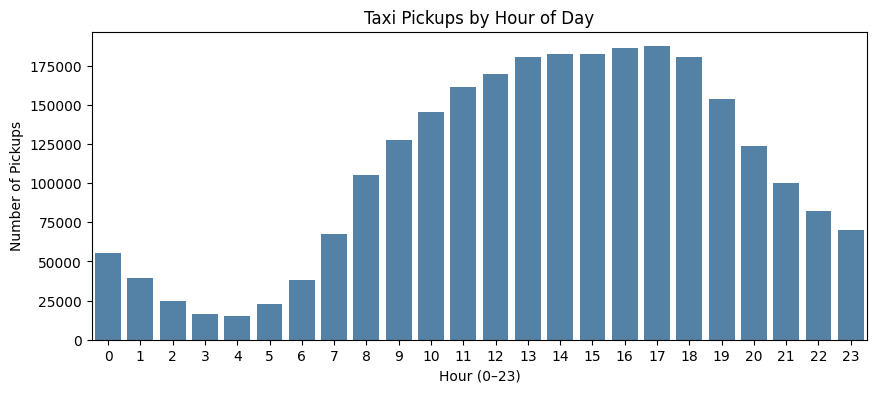

In [36]:
# Taxi pickups by hour
plt.figure(figsize=(10,4))
sns.countplot(x='hour', data=taxi_df, color='steelblue')
plt.title('Taxi Pickups by Hour of Day')
plt.xlabel('Hour (0–23)')
plt.ylabel('Number of Pickups')
plt.show()


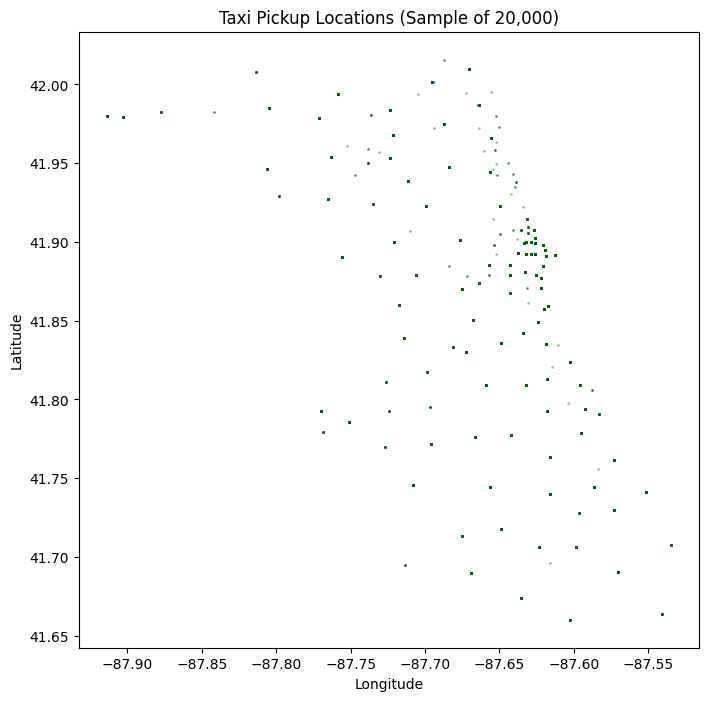

In [38]:
import matplotlib.pyplot as plt

# 1) Take a random sample
sample = taxi_df.sample(20000)

# 2) Plot pickup locations
plt.figure(figsize=(8, 8))
plt.scatter(
    sample['Pickup Centroid Longitude'],
    sample['Pickup Centroid Latitude'],
    s=1,
    alpha=0.3,
    color='darkgreen'
)
plt.title('Taxi Pickup Locations (Sample of 20,000)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


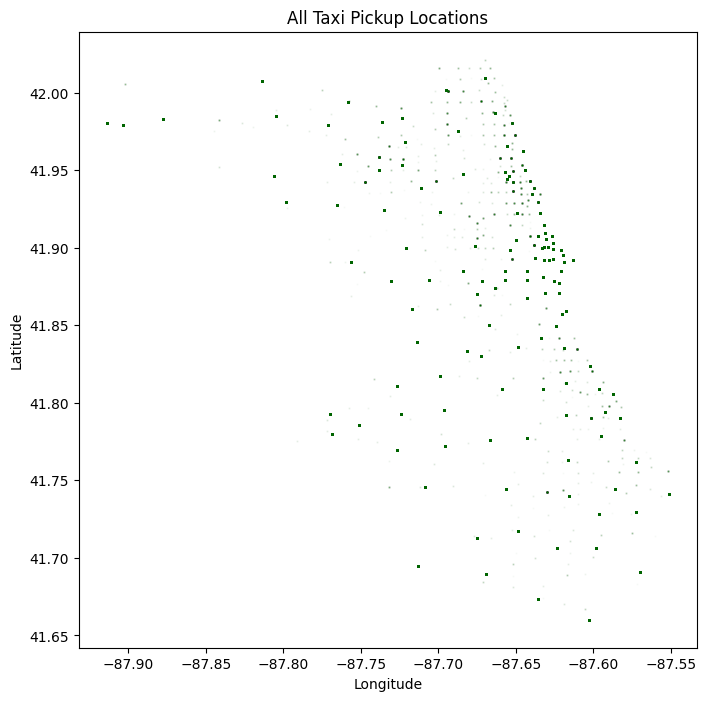

In [40]:

# 1) (Optional) clean outliers / NaNs as before
clean = taxi_df.dropna(subset=['Pickup Centroid Longitude','Pickup Centroid Latitude'])
clean = clean[
    clean['Pickup Centroid Longitude'].between(-87.95, -87.55) &
    clean['Pickup Centroid Latitude'].between(41.65, 42.05)
]

# 2) Plot every pickup
plt.figure(figsize=(8, 8))
plt.scatter(
    clean['Pickup Centroid Longitude'],
    clean['Pickup Centroid Latitude'],
    s=0.5,          # very small points
    alpha=0.02,     # very faint so density shows up
    color='darkgreen'
)
plt.gca().set_aspect('equal', adjustable='box')
plt.title('All Taxi Pickup Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


### 2.2 Air Quality Data Exploration

In [42]:
aq_df.head()

,DeviceId,LocationName,Latitude,Longitude,ReadingDateTimeUTC,PM25,CalibratedPM25,CalibratedO3,CalibratedNO2,CO,Temperature,Humidity,timestamp
0,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:03:00,5.561094,NaN,NaN,NaN,0.123580,27.383499,55.128479,2021-06-20 00:03:00+00:00
1,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:08:10,6.633914,NaN,NaN,NaN,0.132103,27.079086,55.059814,2021-06-20 00:08:10+00:00
2,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:13:20,4.068707,NaN,NaN,NaN,0.131126,27.079086,55.035400,2021-06-20 00:13:20+00:00
3,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:18:30,6.351702,NaN,NaN,NaN,0.138784,26.945572,54.632568,2021-06-20 00:18:30+00:00
4,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:23:40,9.574065,NaN,NaN,NaN,0.413070,26.828079,53.907776,2021-06-20 00:23:40+00:00


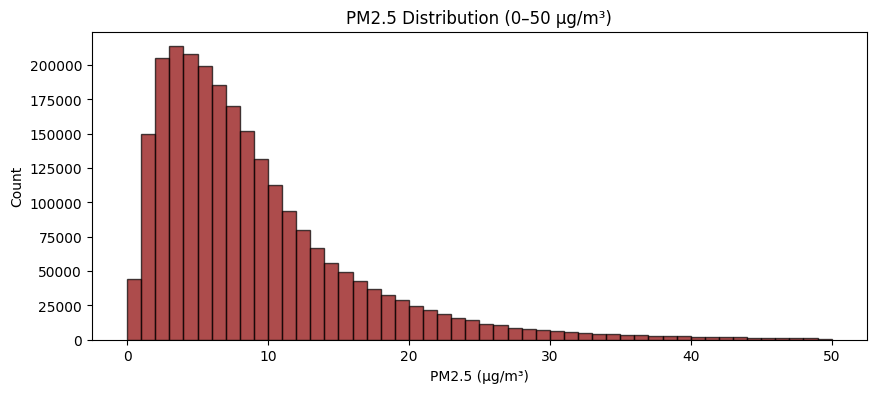

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# Option A: use the `range` argument
plt.figure(figsize=(10,4))
plt.hist(
    aq_df['PM25'],
    bins=50,
    range=(0, 50),
    color='darkred',
    edgecolor='black',
    alpha=0.7
)
plt.title('PM2.5 Distribution (0–50 µg/m³)')
plt.xlabel('PM2.5 (µg/m³)')
plt.ylabel('Count')
plt.show()


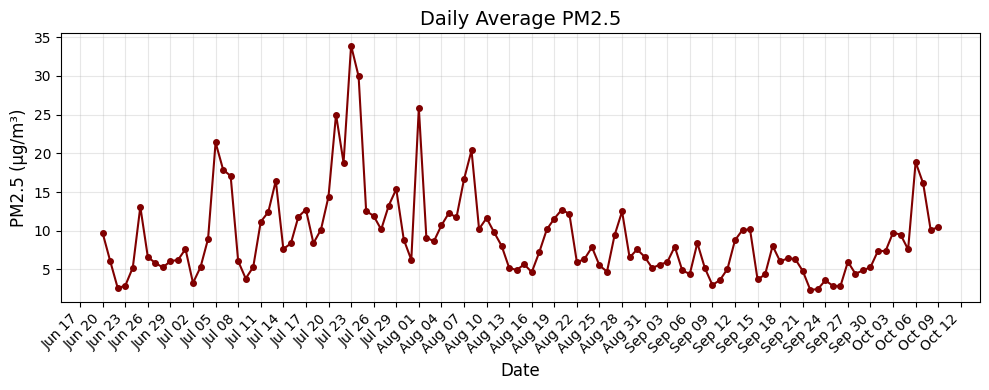

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 0) Ensure you have a proper datetime index
aq_df['timestamp'] = pd.to_datetime(aq_df['timestamp'], errors='coerce')

# 1) Compute daily average PM2.5
daily_pm = (
    aq_df
    .set_index('timestamp')['PM25']
    .resample('D')
    .mean()
)

# 2) Plot
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(
    daily_pm.index, 
    daily_pm.values,
    color='maroon',
    marker='o',
    ms=4,
    linestyle='-'
)

# 3) Titles & labels
ax.set_title('Daily Average PM2.5', fontsize=14)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('PM2.5 (µg/m³)', fontsize=12)

# 4) Date formatting: one tick every 3 days
ax.xaxis.set_major_locator(mdates.DayLocator(interval=3))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
plt.xticks(rotation=45, ha='right')

# 5) Light grid, tight layout
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## 3. Spatio-Temporal Join via GeoHash

In [59]:

# Precision for GeoHash
PREC = 6

# Loop over both DataFrames, computing geohash + hourly floor
for df, lat_col, lon_col, name in [
    (taxi_df, 'Pickup Centroid Latitude',  'Pickup Centroid Longitude',  'Taxi'),
    (aq_df,   'Latitude',                  'Longitude',                  'Air Quality')
]:
    # 1) Compute GeoHash
    df['geohash'] = df.apply(
        lambda r: geohash.encode(r[lat_col], r[lon_col], PREC),
        axis=1
    )
    # 2) Floor timestamp to the hour
    df['hour'] = df['timestamp'].dt.floor('H')
    
    # 3) Show the new columns
    print(f"\n{name} data with geohash + hour:")
    display(df[[ 'timestamp', lat_col, lon_col, 'geohash', 'hour' ]].head())



Taxi data with geohash + hour:


,timestamp,Pickup Centroid Latitude,Pickup Centroid Longitude,geohash,hour
0,2021-10-03 20:30:00,41.877406,-87.621972,dp3wnp,2021-10-03 20:00:00
1,2021-10-03 20:30:00,41.979071,-87.903040,dp3qzd,2021-10-03 20:00:00
2,2021-10-03 20:30:00,41.899602,-87.633308,dp3wmg,2021-10-03 20:00:00
3,2021-10-03 20:30:00,41.980264,-87.913625,dp3qz6,2021-10-03 20:00:00
4,2021-10-03 20:30:00,41.878866,-87.625192,dp3wnp,2021-10-03 20:00:00



Air Quality data with geohash + hour:


,timestamp,Latitude,Longitude,geohash,hour
0,2021-06-20 00:03:00+00:00,41.794921,-87.625857,dp3ty0,2021-06-20 00:00:00+00:00
1,2021-06-20 00:08:10+00:00,41.794921,-87.625857,dp3ty0,2021-06-20 00:00:00+00:00
2,2021-06-20 00:13:20+00:00,41.794921,-87.625857,dp3ty0,2021-06-20 00:00:00+00:00
3,2021-06-20 00:18:30+00:00,41.794921,-87.625857,dp3ty0,2021-06-20 00:00:00+00:00
4,2021-06-20 00:23:40+00:00,41.794921,-87.625857,dp3ty0,2021-06-20 00:00:00+00:00


### 3.1 Aggregate by (geohash, hour)

In [61]:

# 1) Re‐floor timestamps to the hour and remove any tz info
taxi_df['hour'] = taxi_df['timestamp'].dt.floor('h').dt.tz_localize(None)
aq_df['hour']   = aq_df['timestamp'].dt.floor('h').dt.tz_localize(None)

# 2) Aggregate taxi pickups per (geohash, hour)
taxi_agg = (
    taxi_df
    .groupby(['geohash','hour'])
    .size()
    .rename('pickup_count')
    .reset_index()
)

# 3) Aggregate air‐quality PM2.5 per (geohash, hour)
aq_agg = (
    aq_df
    .groupby(['geohash','hour'])['PM25']
    .mean()
    .rename('mean_PM25')
    .reset_index()
)

# 4) Inner‐join on geohash & hour
merged = pd.merge(
    taxi_agg,
    aq_agg,
    on=['geohash','hour'],
    how='inner'
)

# 5) Inspect
print("Merged shape:", merged.shape)
merged.head()


Merged shape: (13007, 4)


,geohash,hour,pickup_count,mean_PM25
0,dp3tq3,2021-08-24 12:00:00,4,5.331973
1,dp3trw,2021-07-01 14:00:00,1,8.821083
2,dp3trw,2021-07-01 16:00:00,2,9.983337
3,dp3trw,2021-07-01 17:00:00,2,7.592660
4,dp3trw,2021-07-01 18:00:00,2,7.895345


## 4. Pattern & Correlation Analysis

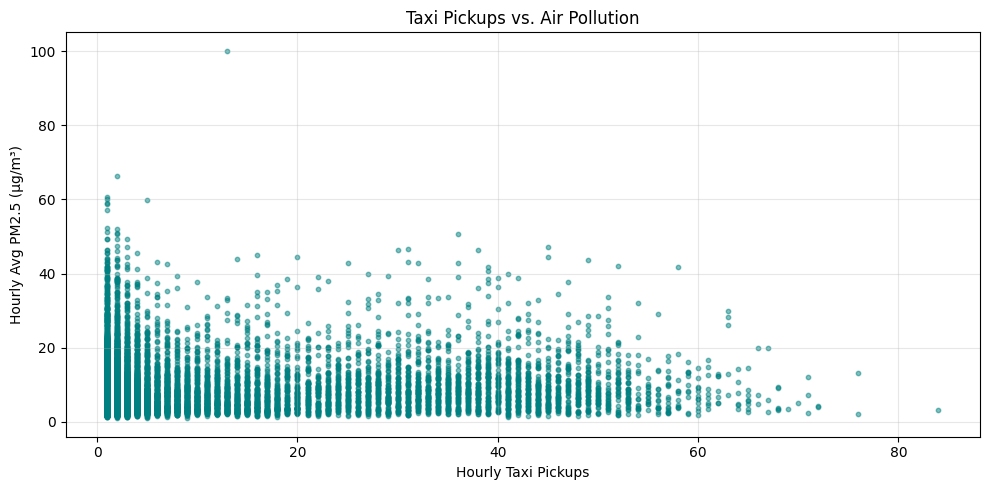

Pearson correlation (pickups vs PM2.5): 0.04


In [62]:
# 4.1 Scatter & Pearson correlation on your merged cell‐hour data
plt.figure(figsize=(10, 5))
plt.scatter(
    merged['pickup_count'],
    merged['mean_PM25'],
    alpha=0.5,
    s=10,
    color='teal'
)
plt.xlabel('Hourly Taxi Pickups')
plt.ylabel('Hourly Avg PM2.5 (µg/m³)')
plt.title('Taxi Pickups vs. Air Pollution')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Compute Pearson correlation
r = merged['pickup_count'].corr(merged['mean_PM25'])
print(f"Pearson correlation (pickups vs PM2.5): {r:.2f}")

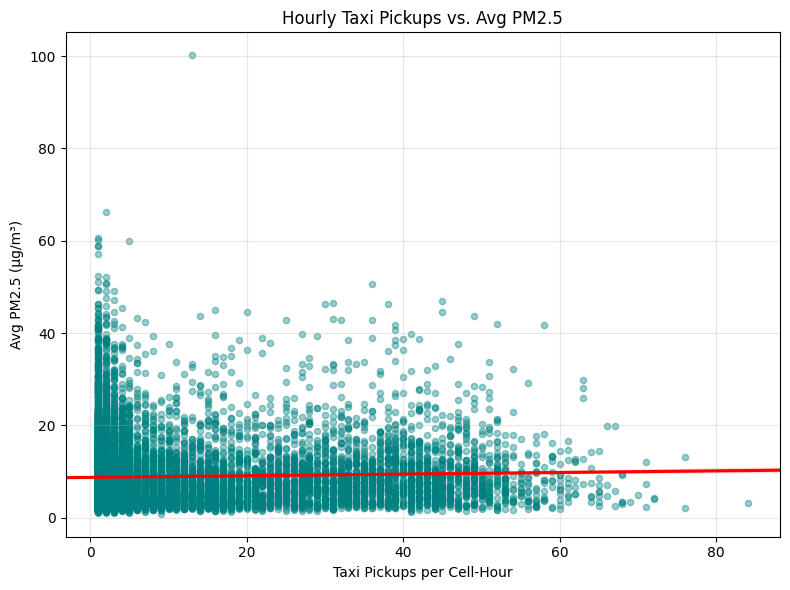

In [90]:
plt.figure(figsize=(8,6))
sns.regplot(
    x='pickup_count',
    y='mean_PM25',
    data=merged,               # or joined_coords if you renamed it
    scatter_kws={'alpha':0.4, 's':20, 'color':'teal'},
    line_kws={'color':'red'},
    ci=95,
    truncate=False
)
plt.title('Hourly Taxi Pickups vs. Avg PM2.5')
plt.xlabel('Taxi Pickups per Cell‐Hour')
plt.ylabel('Avg PM2.5 (µg/m³)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

This plot shows, for each geographic cell-hour, the number of taxi pickups (x-axis) against the average PM₂.₅ concentration (y-axis). Each teal dot is one cell-hour, and the red line is the least-squares regression line through those points.

Point cloud: Most cell-hours have fewer than ~20 pickups, and their PM₂.₅ levels range broadly from near 0 up to around 40 µg/m³ (with a few extreme outliers above 60 µg/m³). As taxi volume rises above ~40 pickups, the dispersion in pollution narrows and concentrates between roughly 5–20 µg/m³.

Regression line: The slight upward slope of the red line indicates a weak positive association—cell-hours with more taxi activity tend to have somewhat higher average PM₂.₅.

Interpretation: While there is a detectable trend, the very wide vertical spread around the line shows that taxi pickups alone explain only a small fraction of the variability in air pollution; other sources and meteorological factors play a larger role.

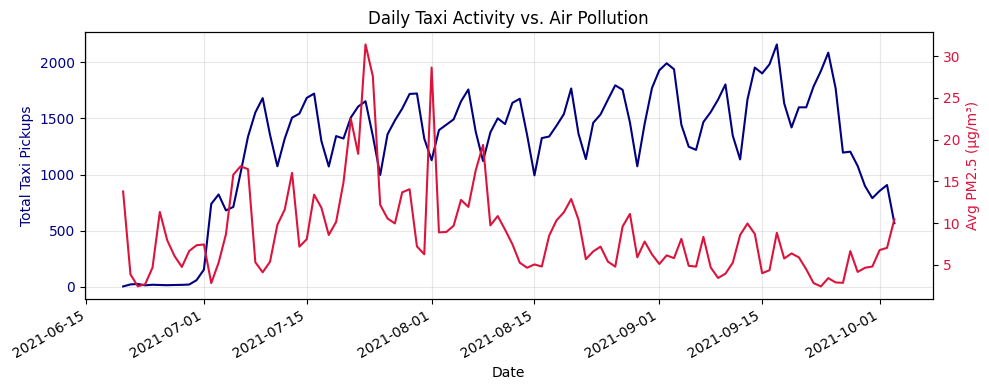

In [91]:
# 1) Build daily city-wide totals
daily = (
    merged
    .groupby(merged['hour'].dt.date)
    .agg(
        total_pickups=('pickup_count','sum'),
        avg_pm25     =('mean_PM25','mean')
    )
    .reset_index()
    .rename(columns={'hour':'date'})
)

# 2) Plot on dual y-axes
fig, ax1 = plt.subplots(figsize=(10,4))

ax1.plot(daily['date'], daily['total_pickups'], color='navy', label='Total Pickups')
ax1.set_ylabel('Total Taxi Pickups', color='navy')
ax1.tick_params(axis='y', labelcolor='navy')

ax2 = ax1.twinx()
ax2.plot(daily['date'], daily['avg_pm25'], color='crimson', label='Avg PM2.5')
ax2.set_ylabel('Avg PM2.5 (µg/m³)', color='crimson')
ax2.tick_params(axis='y', labelcolor='crimson')

ax1.set_xlabel('Date')
fig.autofmt_xdate(rotation=30)
plt.title('Daily Taxi Activity vs. Air Pollution')
ax1.grid(alpha=0.3)
fig.tight_layout()
plt.show()


This dual‐axis chart overlays the daily total taxi pickups (blue, left axis) with the city-wide average PM₂.₅ (red, right axis) over the summer of 2021.

Taxi activity (blue): Rises sharply in early July, peaking around mid-July and remaining high (1,200–2,200 trips/day) through September. You can see a clear 7-day cycle—weekend dips followed by weekday rebounds—typical of urban commuter patterns.

Air pollution (red): Spikes are more erratic. A few pronounced peaks (e.g., late July, early August) push daily PM₂.₅ above 30 µg/m³, but most days hover between 5–15 µg/m³. There’s no consistent weekly cadence, suggesting that meteorology (wind, temperature inversions) and non-taxi sources (e.g., wildfires, construction dust) drive pollution peaks more than local taxi traffic.

Co-variation: While on some high-taxi days PM₂.₅ is also elevated, the two series frequently diverge—e.g., very high pickups in mid-September coincide with some of the lowest pollution levels. Overall, the loose alignment indicates only a modest link between taxi volume and city-wide PM₂.₅, with other factors dominating day-to-day air quality.

## Interactive Taxi & Air Quality Map




In [96]:
import folium
from folium.plugins import HeatMap
from matplotlib import cm, colors

# 1) Sample your data
# Adjust sample sizes as desired (or remove .sample() to plot all points)
taxi_sample = (
    taxi_df
    [['Pickup Centroid Latitude','Pickup Centroid Longitude']]
    .dropna()
    .sample(50000, random_state=42)
)

aq_sample = (
    aq_df
    [['Latitude','Longitude','PM25','timestamp']]
    .dropna()
    .sample(5000, random_state=42)
)

# 2) Create base map centered on Chicago
center = [
    taxi_sample['Pickup Centroid Latitude'].mean(),
    taxi_sample['Pickup Centroid Longitude'].mean()
]
m = folium.Map(location=center, zoom_start=11, tiles='cartodbpositron')

# 3) Add taxi-pickup heatmap
HeatMap(
    taxi_sample.values.tolist(),
    radius=8,
    blur=15,
    max_zoom=12
).add_to(
    folium.FeatureGroup(name='Taxi Pickups Heatmap').add_to(m)
)

# 4) Prepare PM2.5 color mapping
norm = colors.Normalize(vmin=aq_sample['PM25'].min(), vmax=aq_sample['PM25'].max())
cmap = cm.get_cmap('Reds')
def pm25_to_hex(val):
    rgba = cmap(norm(val))
    return colors.to_hex(rgba)

# 5) Add air-quality sensor markers
aq_fg = folium.FeatureGroup(name='AQ Sensor Readings')
for _, r in aq_sample.iterrows():
    folium.CircleMarker(
        location=(r['Latitude'], r['Longitude']),
        radius=4,
        fill=True,
        fill_color=pm25_to_hex(r['PM25']),
        fill_opacity=0.7,
        stroke=False,
        popup=(
            f"PM2.5: {r['PM25']:.1f} µg/m³<br>"
            f"Time: {r['timestamp']:%Y-%m-%d %H:%M}"
        )
    ).add_to(aq_fg)
aq_fg.add_to(m)

# 6) Layer control
folium.LayerControl(collapsed=False).add_to(m)

# 7) Display
m


C:\Users\muath\AppData\Local\Temp\ipykernel_19980\514671541.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Reds')


This map overlays two complementary layers over the Chicago area:

 1. Taxi Pickups Heatmap (blue)  
- A density‐based “glow” showing where taxi pick-ups concentrate.  
- Darker blue regions (the Loop, Michigan Avenue, O’Hare, major commuter hubs) indicate the highest taxi activity.

 2. Air‐Quality Sensor Readings (orange dots)  
- Each circle marks a PM₂.₅ measurement, color-shaded from pale peach (low readings) to deep orange (high readings).  
- Clicking a dot reveals the exact PM₂.₅ value and timestamp for that location.

---

 Interpretation  
- **Co‐location of traffic & pollution:** The densest taxi zones often coincide with higher PM₂.₅ readings (e.g., downtown), suggesting localized emissions impacts.  
- **Dispersion effects:** Some areas with heavy taxi traffic show only moderate pollution, indicating good airflow or fewer auxiliary sources.  
- **Non‐taxi pollution hotspots:** Isolated orange dots away from blue clusters point to other emission sources (industrial sites, construction or meteorological conditions).  

Use the layer toggles and zoom controls to explore how urban traffic patterns spatially relate to particulate concentrations, and identify neighborhoods where targeted pollution‐mitigation may be most effective.  

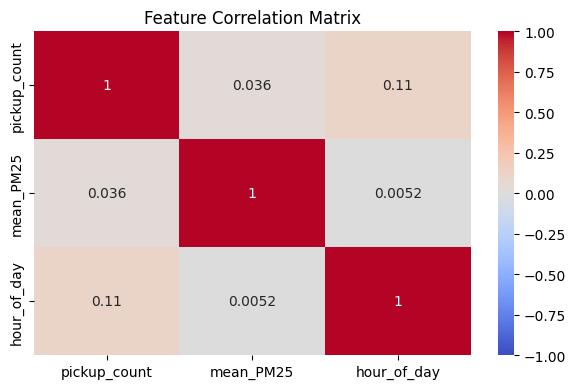

In [ ]:
# 4.2 Correlation matrix heatmap (including time of day)
merged['hour_of_day'] = merged['hour'].dt.hour

# compute correlation matrix
corr_mat = merged[['pickup_count', 'mean_PM25', 'hour_of_day']].corr()

# plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(corr_mat, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()


## 5. DBSCAN Clustering & Evaluation

In [66]:
# 5.1a) Compute centroids per (geohash, hour)
centroids = (
    taxi_df
    .groupby(['geohash','hour'])[['Pickup Centroid Latitude','Pickup Centroid Longitude']]
    .mean()
    .reset_index()
    .rename(columns={
        'Pickup Centroid Latitude':'latitude',
        'Pickup Centroid Longitude':'longitude'
    })
)

In [68]:
# 5.1b) Merge centroids into your merged DataFrame
joined_coords = pd.merge(
    merged,      # <- not `joined`
    centroids,
    on=['geohash','hour'],
    how='left'
)


In [69]:
# 5.1c) Build feature matrix X: [lat, lon, mean_PM25, pickup_count, hour_of_day]
X = np.vstack([
    joined_coords['latitude'],
    joined_coords['longitude'],
    joined_coords['mean_PM25'],
    joined_coords['pickup_count'],
    joined_coords['hour'].dt.hour
]).T

In [70]:
# 5.2) Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Feature matrix shape:", X_scaled.shape)


Feature matrix shape: (13007, 5)


In [71]:
# 5.3) Run DBSCAN
db = DBSCAN(eps=0.5, min_samples=10).fit(X_scaled)
joined_coords['cluster'] = db.labels_


In [72]:
# 5.4) Compute silhouette score (excluding noise)
mask = joined_coords['cluster'] != -1
if mask.sum() > 1:
    score = silhouette_score(X_scaled[mask], joined_coords.loc[mask,'cluster'])
    print(f"DBSCAN silhouette score: {score:.3f}")
else:
    print("Not enough clustered points for silhouette score.")


DBSCAN silhouette score: 0.086


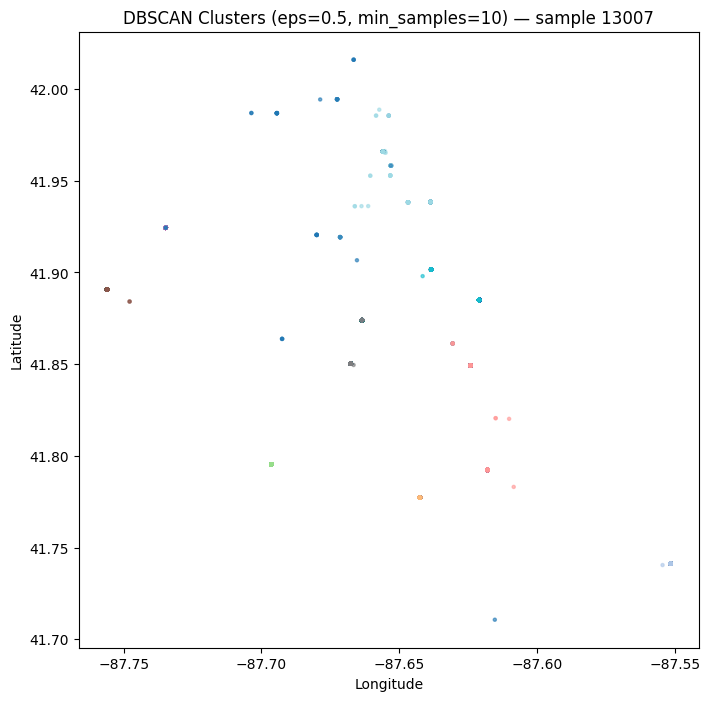

In [74]:
# 5.5) Visualize a sample of clusters
n = min(20000, len(joined_coords))
sample = joined_coords.sample(n=n, random_state=42)

plt.figure(figsize=(8, 8))
plt.scatter(
    sample['longitude'],
    sample['latitude'],
    c=sample['cluster'],
    cmap='tab20',
    s=5,
    alpha=0.6
)
plt.title(f'DBSCAN Clusters (eps=0.5, min_samples=10) — sample {n}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [75]:
# 1) How many points per cluster?
print(joined_coords['cluster'].value_counts(dropna=False))

# 2) Summarize each cluster’s “typical” location & pollution/pickup level
cluster_summary = (
    joined_coords
    .groupby('cluster')
    .agg(
        count=('cluster','size'),
        mean_lat=('latitude','mean'),
        mean_lon=('longitude','mean'),
        mean_pm25=('mean_PM25','mean'),
        mean_pickups=('pickup_count','mean'),
        mean_hour=('hour', lambda x: x.dt.hour.mean())
    )
    .sort_values('count', ascending=False)
)
print(cluster_summary)

# 3) Parameter‐sweep eps & min_samples (optional)
from sklearn.metrics import silhouette_score
best = []
for eps in [0.2,0.5,0.8,1.0]:
    for ms in [5,10,20]:
        labels = DBSCAN(eps=eps, min_samples=ms).fit_predict(X_scaled)
        mask = labels != -1
        if mask.sum()>1:
            score = silhouette_score(X_scaled[mask], labels[mask])
            best.append((eps,ms,score))
best = sorted(best, key=lambda t:-t[2])
print("Top settings (eps, min_samples, silhouette):", best[:5])

# 4) Visualize clusters on an actual map (Folium)
import folium
m = folium.Map(location=[41.88, -87.63], zoom_start=11)
for _, row in joined_coords[joined_coords['cluster']>=0].iterrows():
    folium.CircleMarker(
        [row['latitude'], row['longitude']],
        radius=3,
        weight=0,
        fill=True,
        fill_opacity=0.4,
        fill_color=plt.cm.tab20(row['cluster'] % 20)
    ).add_to(m)
m  # in Jupyter this will render an interactive map


 7     2912
 10    2228
 9     1538
 3     1480
 1     1397
 0     1223
 5     1222
-1      599
 6      252
 2      130
 8       16
 4       10
Name: cluster, dtype: int64
         count   mean_lat   mean_lon  mean_pm25  mean_pickups  mean_hour
cluster                                                                 
 7        2912  41.866684 -87.664767   9.149300     18.558723  11.878091
 10       2228  41.964778 -87.655387   6.537213      8.313285  12.045781
 9        1538  41.885341 -87.621369   8.016098     27.382965  13.529259
 3        1480  41.808255 -87.619665   7.832841      2.763514  13.895946
 1        1397  41.777196 -87.642498   9.446591      2.229062  13.223336
 0        1223  41.741242 -87.551431   7.443793      2.035159  13.045789
 5        1222  41.890598 -87.756033   7.988045      2.041735  13.029460
-1         599  41.871703 -87.654159  26.565303     13.410684  12.045075
 6         252  41.924347 -87.734740   7.602408      1.182540  12.857143
 2         130  41.795431

## 6. Parameter Sweep & Silhouette Analysis

In [76]:
# 6.1) DBSCAN hyperparameter grid‐search on your scaled feature matrix X_scaled
eps_vals = np.linspace(0.1, 1.0, 10)
min_samples_vals = [5, 10, 20, 50]

results = []
for eps in eps_vals:
    for ms in min_samples_vals:
        db = DBSCAN(eps=eps, min_samples=ms).fit(X_scaled)
        labels = db.labels_
        mask = labels != -1
        
        # only score if there are at least two non‐noise clusters
        if mask.sum() > 0 and len(set(labels[mask])) > 1:
            score = silhouette_score(X_scaled[mask], labels[mask])
            results.append({
                'eps': eps,
                'min_samples': ms,
                'silhouette': score
            })

# 6.2) Compile results into a DataFrame and sort
res_df = pd.DataFrame(results).sort_values('silhouette', ascending=False).reset_index(drop=True)

# 6.3) Display top configurations
print("Top DBSCAN settings by silhouette score:")
print(res_df.head(10))


Top DBSCAN settings by silhouette score:
   eps  min_samples  silhouette
0  0.1           10    0.559870
1  0.1            5    0.308891
2  0.3           50    0.279083
3  0.4           50    0.196616
4  1.0           50    0.180728
5  1.0           20    0.176388
6  1.0            5    0.173890
7  1.0           10    0.167157
8  0.6           50    0.164215
9  0.5           50    0.158304


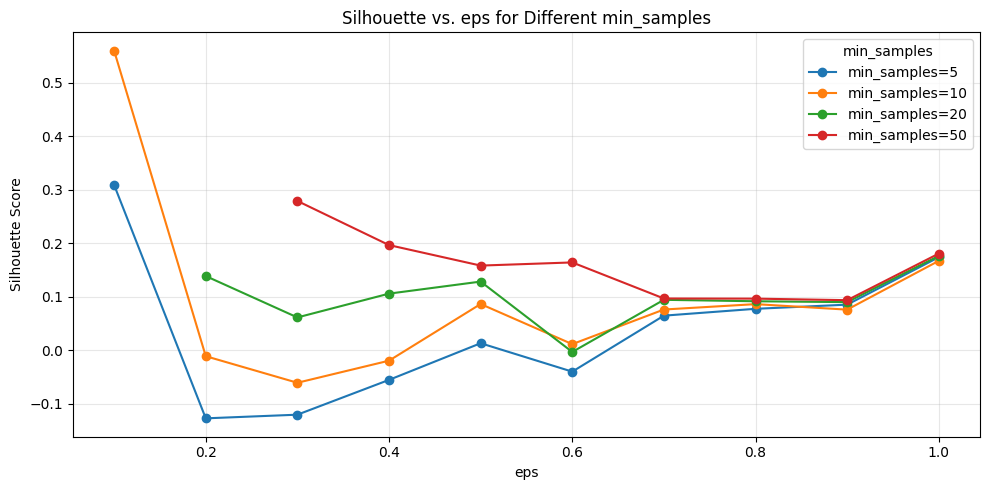

In [80]:
plt.figure(figsize=(10,5))

for ms in sorted(res_df['min_samples'].unique()):
    sub = (
      res_df[res_df['min_samples'] == ms]
      .sort_values('eps')   # <-- important!
    )
    plt.plot(
      sub['eps'], 
      sub['silhouette'], 
      marker='o',
      label=f'min_samples={ms}'
    )

plt.xlabel('eps')
plt.ylabel('Silhouette Score')
plt.title('Silhouette vs. eps for Different min_samples')
plt.legend(title='min_samples')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [82]:
from sklearn.cluster import DBSCAN

best_eps, best_ms = 0.1, 10
labels = DBSCAN(eps=best_eps, min_samples=best_ms).fit_predict(X_scaled)
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise    = (labels == -1).sum()
print(f"Clusters: {n_clusters}, Noise points: {n_noise}")


Clusters: 66, Noise points: 12066


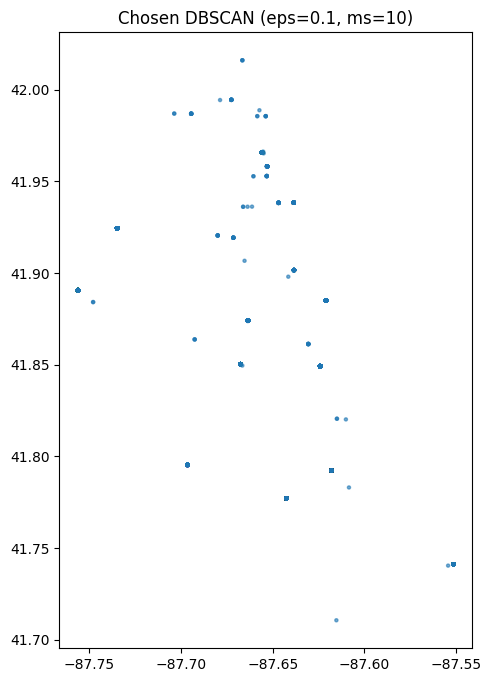

In [83]:
db = DBSCAN(eps=best_eps, min_samples=best_ms).fit(X_scaled)
joined_coords['final_cluster'] = db.labels_

plt.figure(figsize=(8,8))
plt.scatter(
    joined_coords['longitude'],
    joined_coords['latitude'],
    c=joined_coords['final_cluster'],
    cmap='tab20',
    s=5,
    alpha=0.6
)
plt.title(f'Chosen DBSCAN (eps={best_eps}, ms={best_ms})')
plt.gca().set_aspect('equal', 'box')
plt.show()


## 7. Weighted-DBSCAN Variant

Weighted-DBSCAN silhouette: 0.085


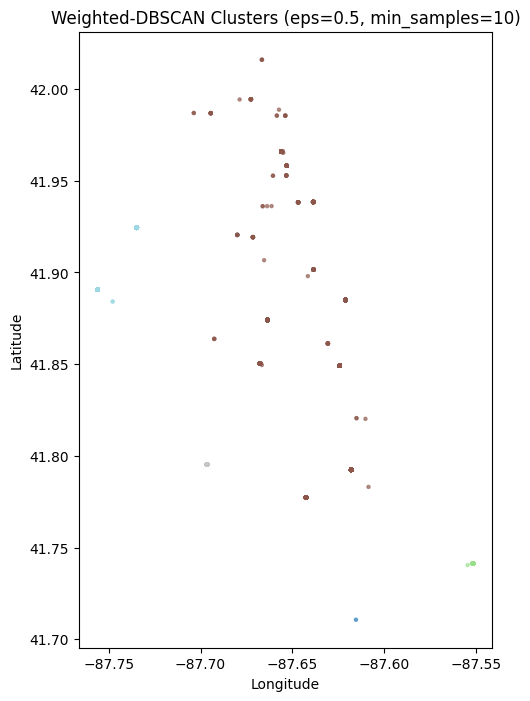

In [85]:
from sklearn.metrics import pairwise_distances, silhouette_score

# 7.1) Define weighted distance function
def weighted_dist(u, v, w_sp=0.7, w_ft=0.3):
    # u[:2], v[:2] = [lat, lon]; u[2:], v[2:] = [mean_PM25, pickup_count, hour_of_day]
    ds = np.linalg.norm(u[:2] - v[:2])   # spatial distance
    df = np.linalg.norm(u[2:] - v[2:])   # feature distance
    return w_sp*ds + w_ft*df

# 7.2) Build the full distance matrix (precomputed)
D = pairwise_distances(X_scaled, metric=lambda a, b: weighted_dist(a, b))

# 7.3) Run DBSCAN with the precomputed distances
eps, min_samples = 0.5, 10
db_w = DBSCAN(eps=eps, min_samples=min_samples, metric='precomputed')
labels_w = db_w.fit_predict(D)
joined_coords['cluster_w'] = labels_w

# 7.4) Compute silhouette (excluding noise)
mask_w = labels_w != -1
if mask_w.sum() > 1 and len(set(labels_w[mask_w])) > 1:
    sil_w = silhouette_score(X_scaled[mask_w], labels_w[mask_w])
    print(f"Weighted-DBSCAN silhouette: {sil_w:.3f}")
else:
    print("Not enough clusters for silhouette score.")

# 7.5) Visualize the weighted‐DBSCAN clusters on a map
plt.figure(figsize=(8, 8))
plt.scatter(
    joined_coords['longitude'],
    joined_coords['latitude'],
    c=joined_coords['cluster_w'],
    cmap='tab20',
    s=5,
    alpha=0.6
)
plt.title(f'Weighted‐DBSCAN Clusters (eps={eps}, min_samples={min_samples})')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()


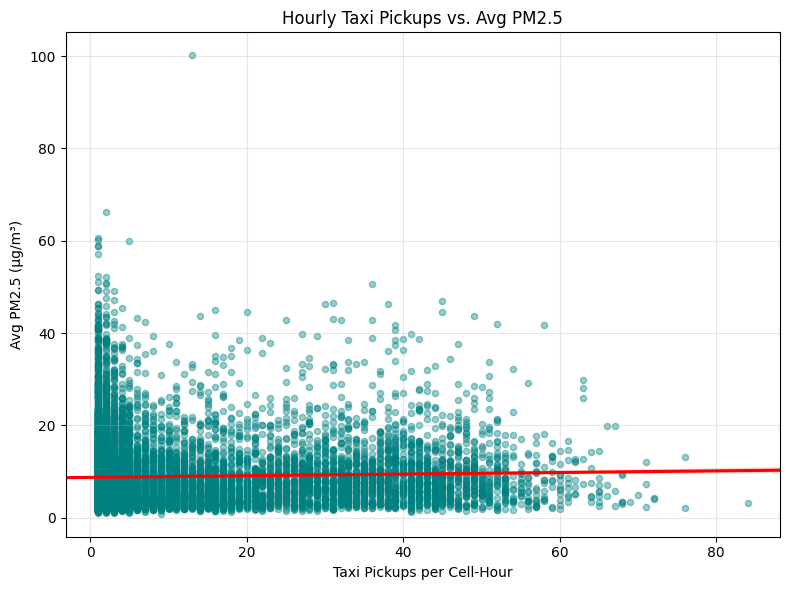

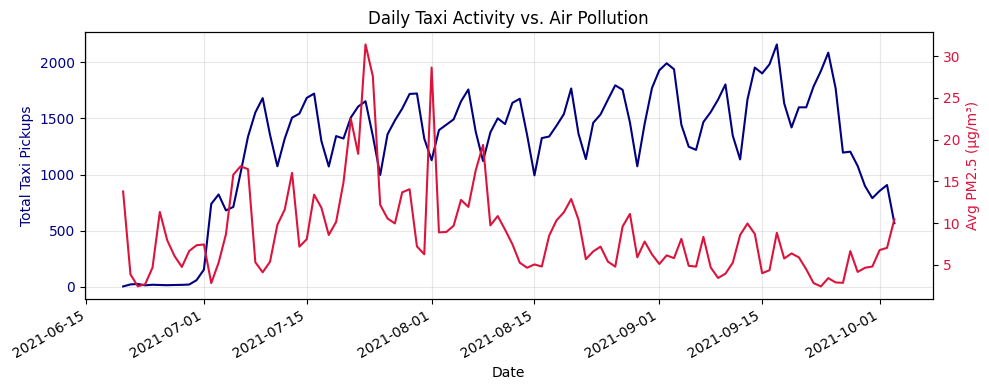

In [89]:
# 1) Build daily city-wide totals
daily = (
    merged
    .groupby(merged['hour'].dt.date)
    .agg(
        total_pickups=('pickup_count','sum'),
        avg_pm25     =('mean_PM25','mean')
    )
    .reset_index()
    .rename(columns={'hour':'date'})
)

# 2) Plot on dual y-axes
fig, ax1 = plt.subplots(figsize=(10,4))

ax1.plot(daily['date'], daily['total_pickups'], color='navy', label='Total Pickups')
ax1.set_ylabel('Total Taxi Pickups', color='navy')
ax1.tick_params(axis='y', labelcolor='navy')

ax2 = ax1.twinx()
ax2.plot(daily['date'], daily['avg_pm25'], color='crimson', label='Avg PM2.5')
ax2.set_ylabel('Avg PM2.5 (µg/m³)', color='crimson')
ax2.tick_params(axis='y', labelcolor='crimson')

ax1.set_xlabel('Date')
fig.autofmt_xdate(rotation=30)
plt.title('Daily Taxi Activity vs. Air Pollution')
ax1.grid(alpha=0.3)
fig.tight_layout()
plt.show()
